In [1]:
#import statements
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import pandas as pd
import numpy as np
import numpy.ma as ma
import sesd
from datetime import datetime
import statistics
from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
register_matplotlib_converters()
import matplotlib.patches as mpatches

import anomalies
import remove_nans


In [2]:
hhw_data_daily = pd.read_csv("../.././data/formatted_3year/daily/hhw_01-01-2017_06-14-2020.csv")
hhw_data_daily.set_index('dt', inplace=True)
chw_data_daily = pd.read_csv("../.././data/formatted_3year/daily/chw_01-01-2017_06-14-2020.csv")
chw_data_daily.set_index('dt', inplace=True)
steam_data_daily = pd.read_csv("../.././data/formatted_3year/daily/steam_01-01-2017_06-14-2020.csv")
steam_data_daily.set_index('dt', inplace=True)

In [10]:
def show_anomalies_plot(daily_df, col, count, sesd_anoms, std_anoms, iqr_anoms, iqr_upper_bound, percent_anomalies):
    """
    Plot the anomalies if the user chose to remove anomalies
    """
    #ts is an array of the previous data and x is used for graphing and is a range of indices
    ts=daily_df[daily_df.columns[0]]
    x = np.asarray(range(len(ts)))
    x_start = 0
    x_end = len(x)-1
    x_len = x_end - x_start
    labels_and_colors=[] #keep track of this for making legend

    #create equal spaces apart to put ticks with dates
    xt = [x_start, x_start + (x_len//3), x_start+(2*(x_len//3)), x_end]
    xtl=[]
    for index in xt: 
        #xtl.append(pd.Timestamp.date(daily_df.index[index]))
        xtl.append(daily_df.index[index])

    plt.figure(figsize=(12,8))
    plt.title("Anomalies for {}".format(col), size=20)
    plt.plot(x, ts, color="#7ea4ce", label="Original Usage") #original data

    #only plot the anomalies boolean array if not none which means the user selected to have that anomaly
    #detection method done
    if std_anoms!=None:
        labels_and_colors.append(["STD anomalies", "red", None])
        plt.scatter(x[std_anoms],ts[std_anoms], label=labels_and_colors[-1][0], color=labels_and_colors[-1][1],\
                    zorder = 5)
    if sesd_anoms!=None:
        labels_and_colors.append(["Seasonal anomalies", "blue", None])
        plt.scatter(x[sesd_anoms],ts[sesd_anoms], label=labels_and_colors[-1][0], color=labels_and_colors[-1][1],\
                    zorder = 5)
    if sesd_anoms!=None and std_anoms!=None:
        labels_and_colors.append(["STD & Seasonal anomalies", "purple", None])
        plt.scatter(x[sesd_anoms and std_anoms],ts[sesd_anoms and std_anoms], label=labels_and_colors[-1][0],\
                    color=labels_and_colors[-1][1], zorder = 5)
    if iqr_anoms!=None:
        labels_and_colors.append(["IQR upper boundary", "orange", "dashed"])
        plt.plot(x, iqr_upper_bound, label=labels_and_colors[-1][0], color=labels_and_colors[-1][1],\
                 linestyle=labels_and_colors[-1][2])
        labels_and_colors.append(["IQR anomalies", "green", None])
        plt.scatter(x[iqr_anoms],ts[iqr_anoms], label=labels_and_colors[-1][0], color=labels_and_colors[-1][1],\
                    zorder = 5)

    #set the ticks, names and ranges for the x and y axis
    plt.xticks(xt, xtl, size=15)
    plt.xlim(x_start, x_end)
    plt.yticks(size=15)
    plt.ylim()
    plt.xlabel("Date", size=15)
    plt.ylabel("Utility Usage", size=15)
    plt.grid(alpha=.3)

    #set the legend outside the graph window and set the text inside it to show the percent anomalies
    handles=[]
    for label_color_pair in labels_and_colors:
        handles.append(mpatches.Patch(label=label_color_pair[0], color=label_color_pair[1],\
                                      linestyle=label_color_pair[2]))
    anomalies="Percent data marked anomalous:\n %.2f%%" % (percent_anomalies) 
    handles.append(mpatches.Patch(color='none', label=anomalies))
    plt.legend(handles=handles, loc='upper right', borderaxespad=0., fontsize=12) #bbox_to_anchor=(1.02, 1), 
    plt.show()

In [8]:
def plot_all_anomalies(data):
    for col in data.columns:
        df=pd.DataFrame(index=data.index, columns=['data'])
        df['data']=data[col]
        df=remove_nans.drop_beg_nans_rest_0(df)
        if len(df['data'])<2*365:
            print("too little data")
            continue
        imputed_data,seasonal_anomalies,std_anomalies,iqr_anomalies,iqr_upper_bounds, percent_anomalies=\
            anomalies.removeAnomaliesAndImpute(df,True,True,True,365)
        length_data=len(df['data'])
        fractions=4
        min_index=0
        max_index=int(length_data/fractions)
        for i in range(0,fractions):
            trimmed_df=pd.DataFrame(index=df.index[min_index:max_index], columns=['data'])
            trimmed_df['data']=df['data'][min_index:max_index]
            show_anomalies_plot(trimmed_df, col, i, seasonal_anomalies[min_index:max_index],\
                                std_anomalies[min_index:max_index],iqr_anomalies[min_index:max_index],\
                                iqr_upper_bounds[min_index:max_index],percent_anomalies)
            min_index=max_index
            max_index+=int(length_data/fractions)

# HHW

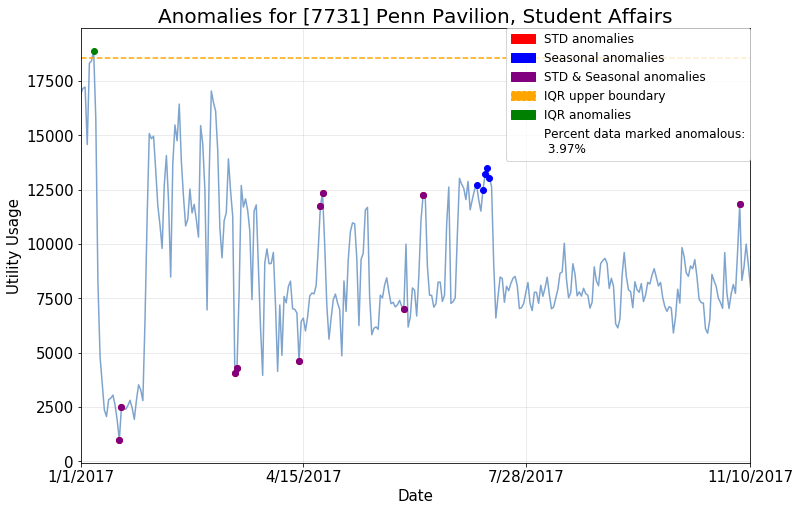

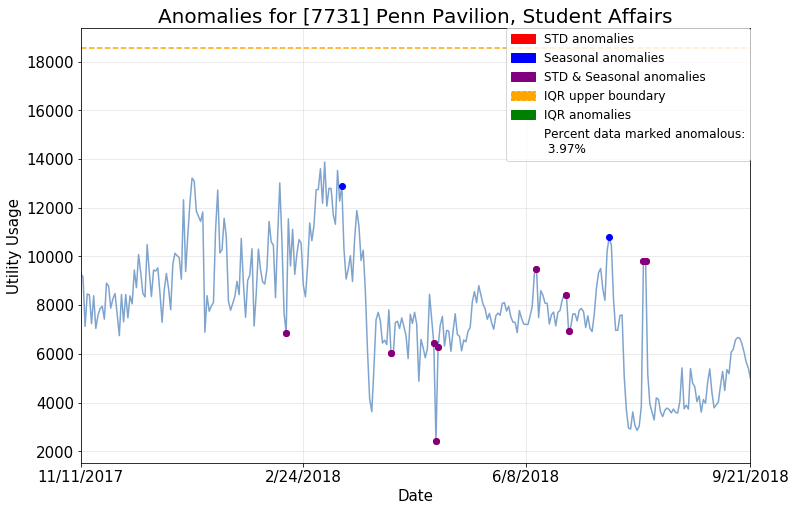

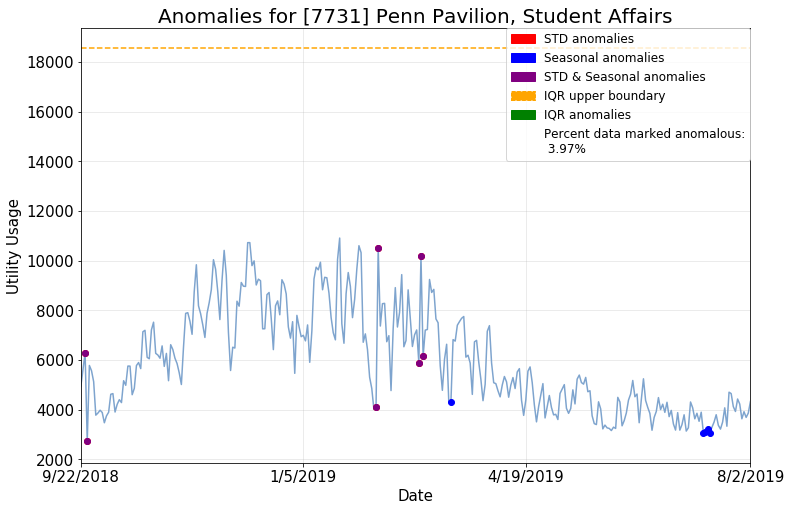

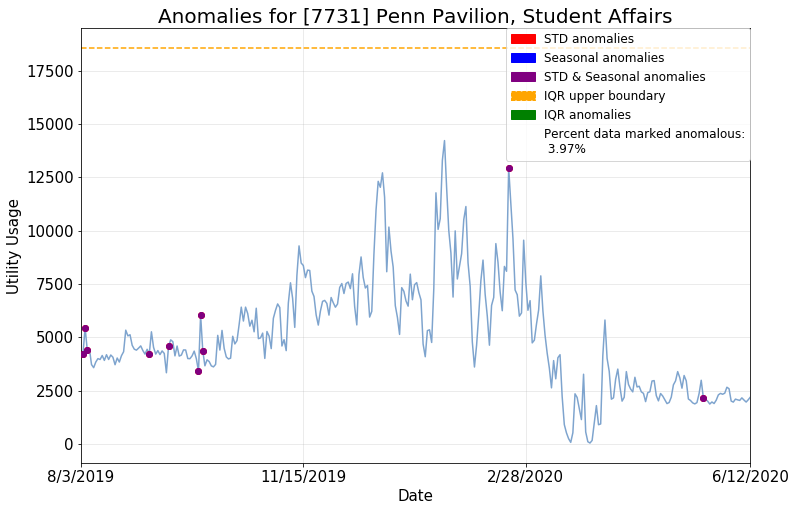

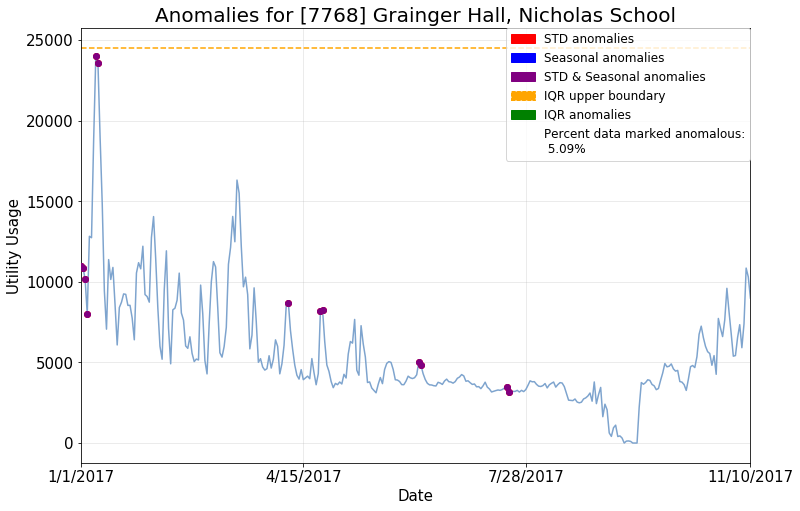

...

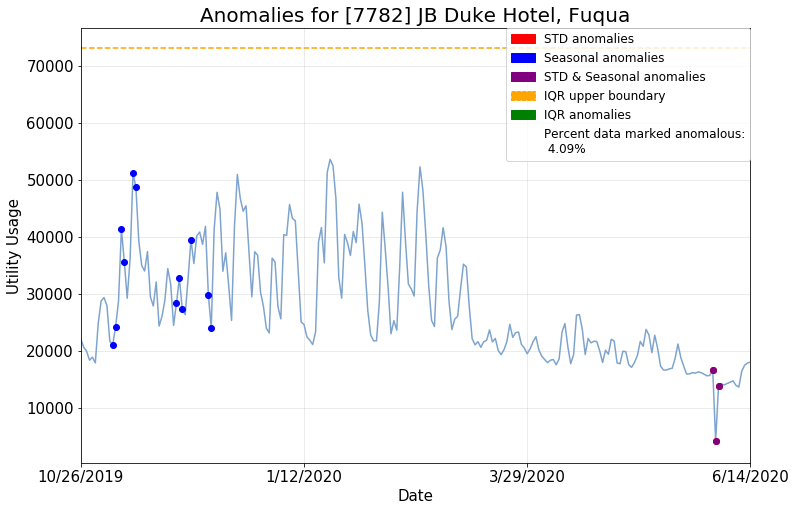

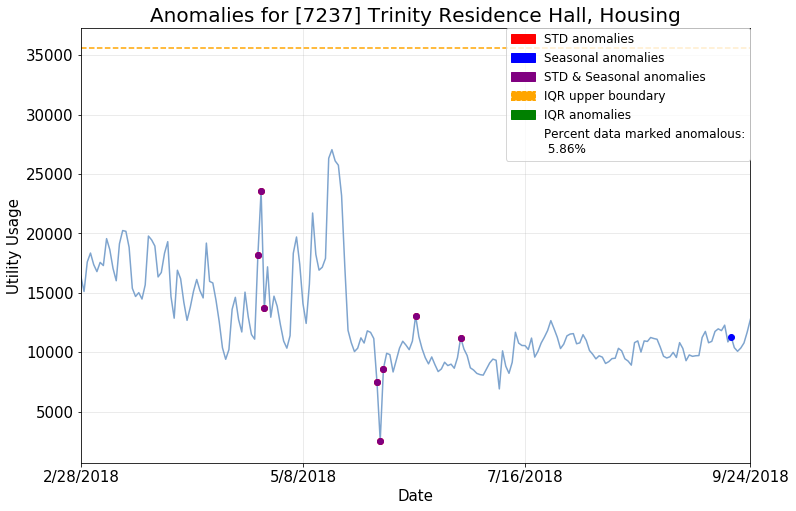

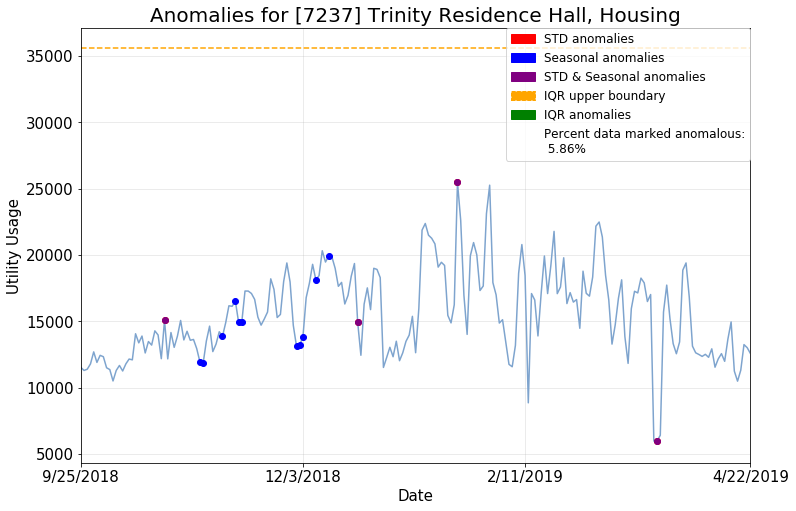

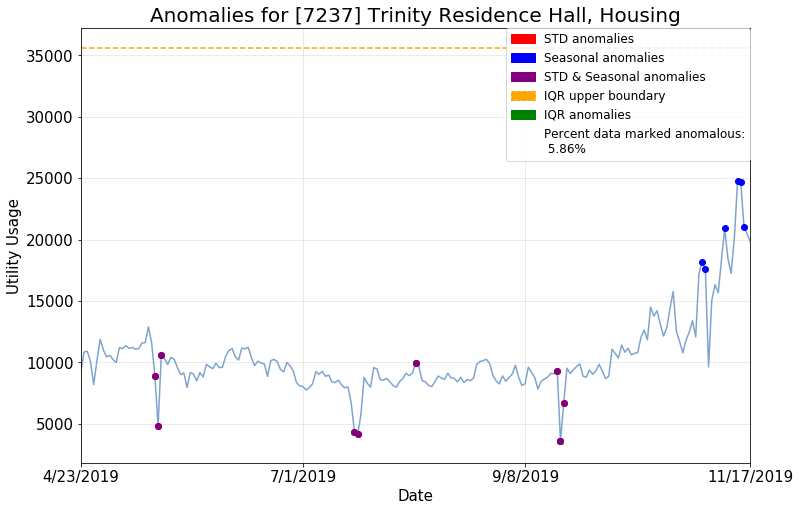

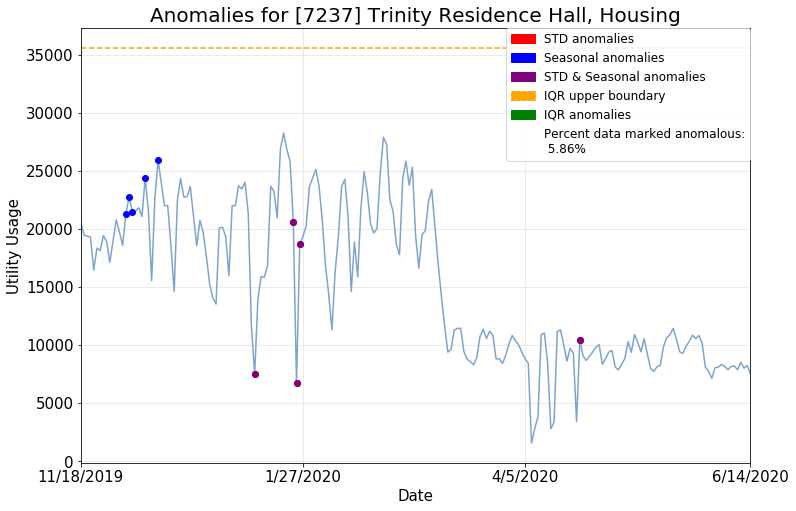

too little data
too little data


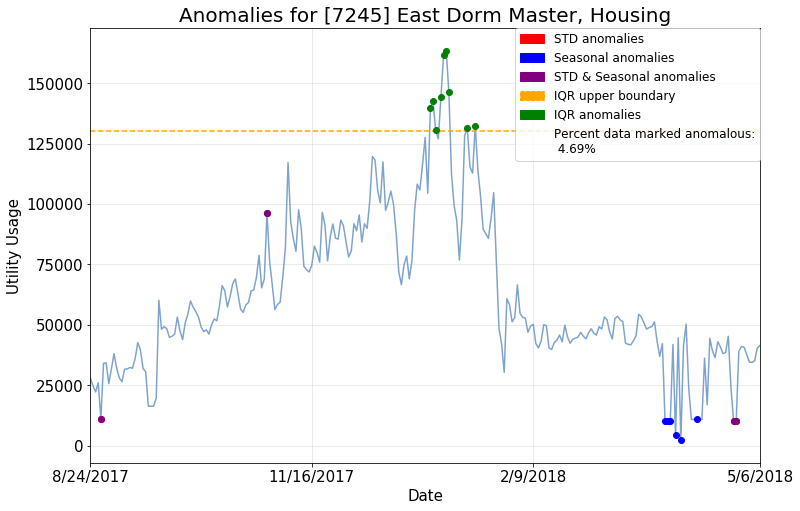

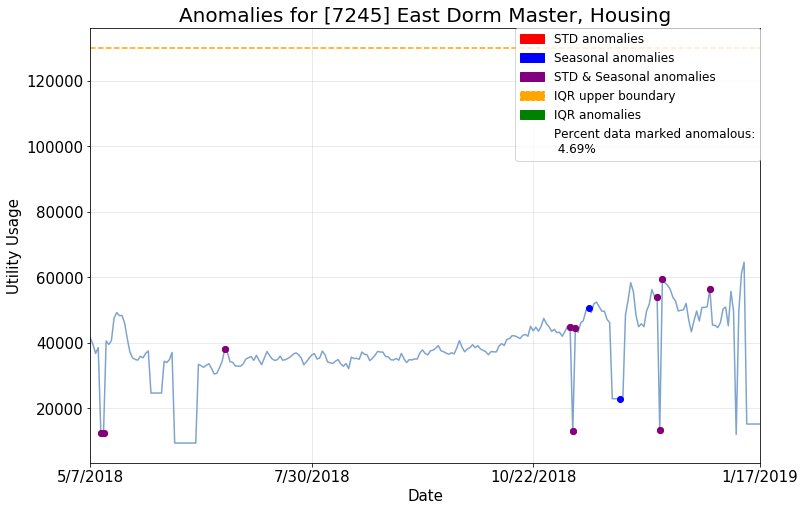

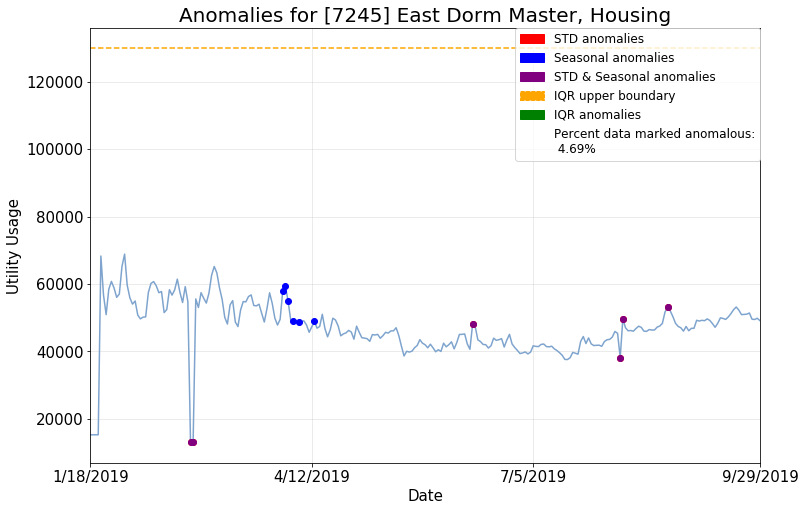

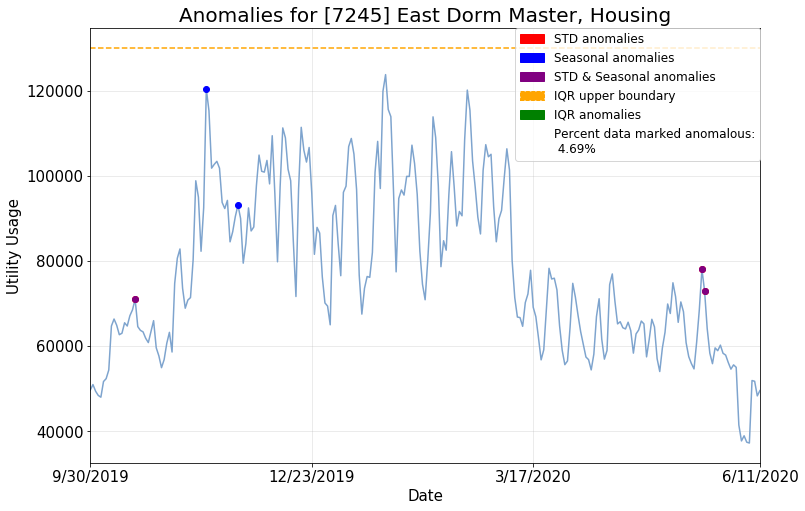

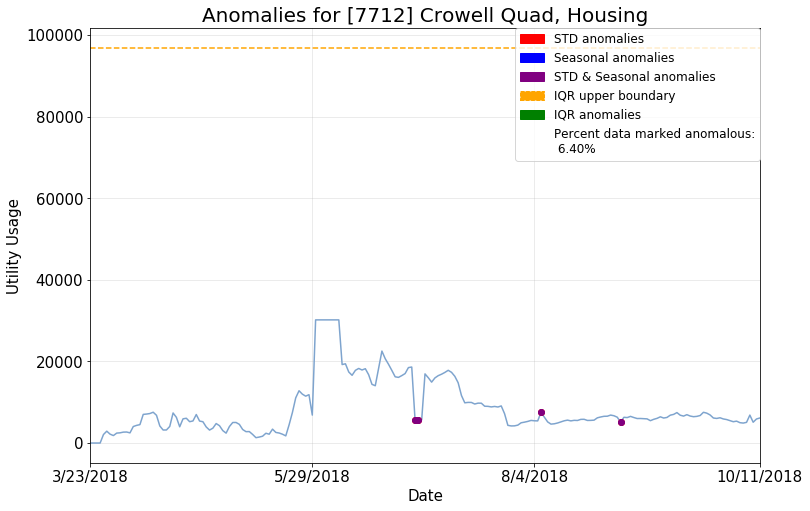

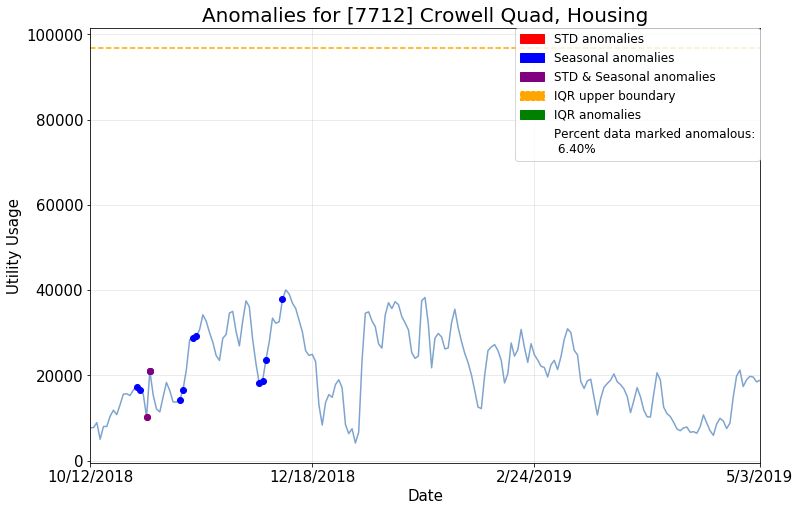

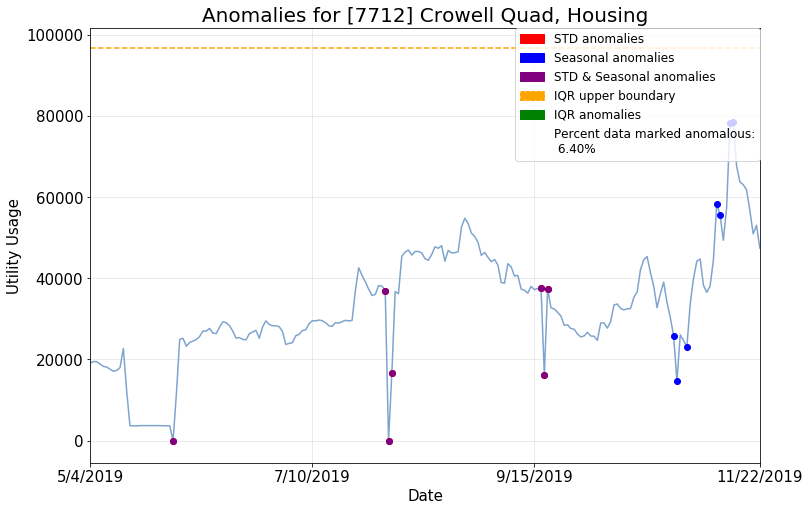

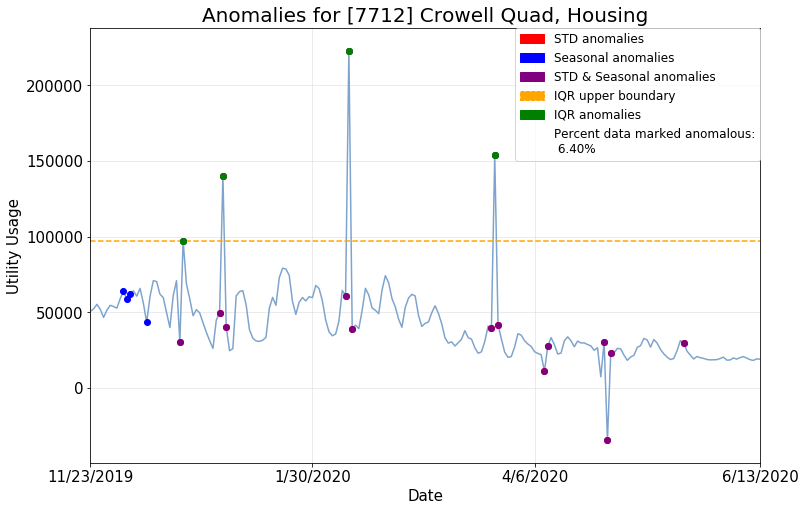

too little data
too little data
too little data
too little data
too little data


In [11]:
plot_all_anomalies(hhw_data_daily)

# CHW 

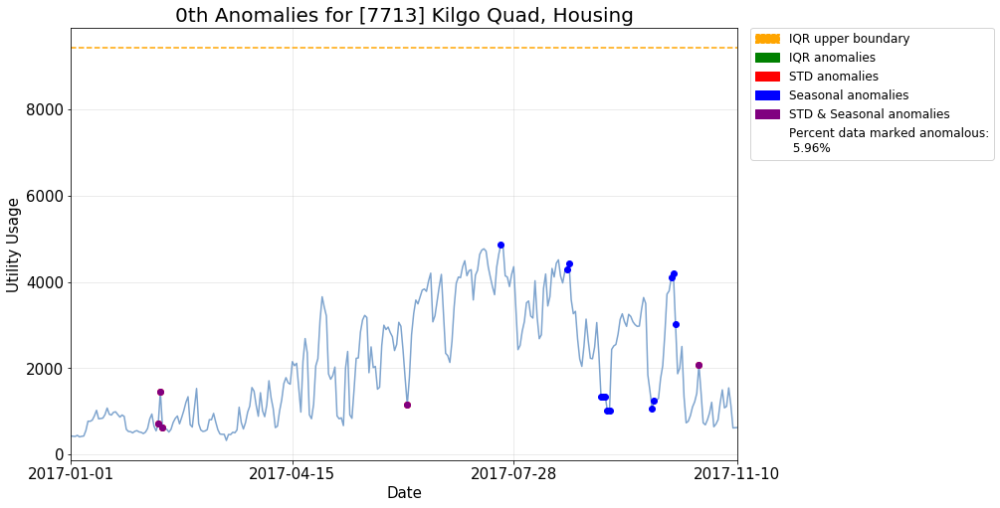

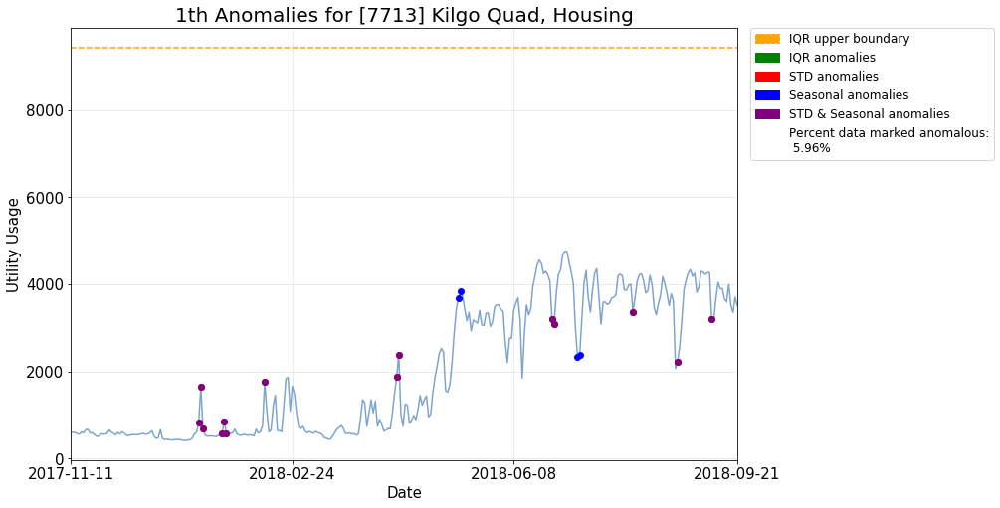

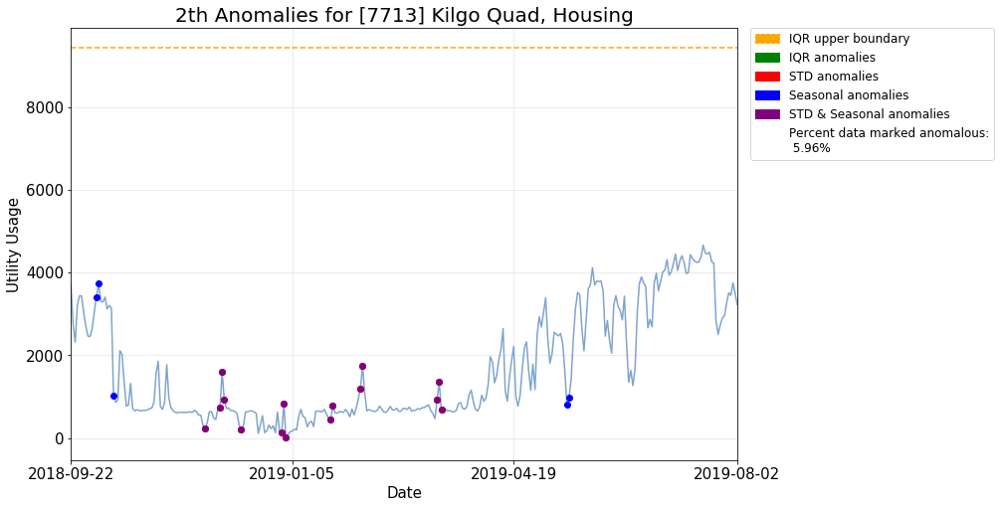

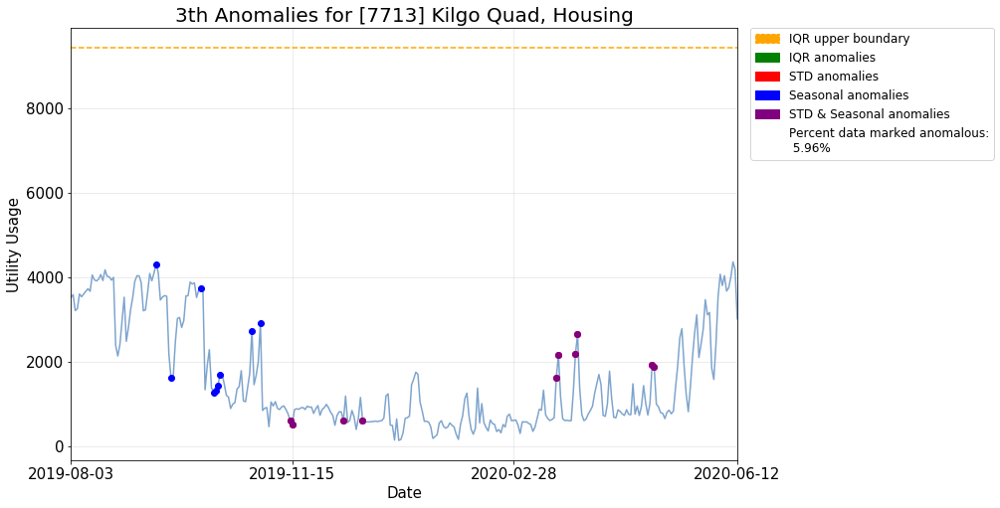

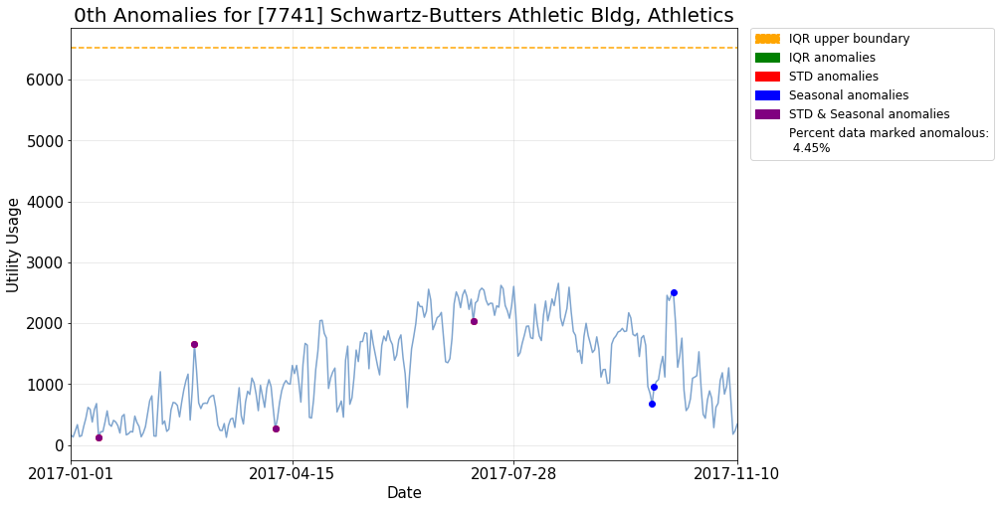

...

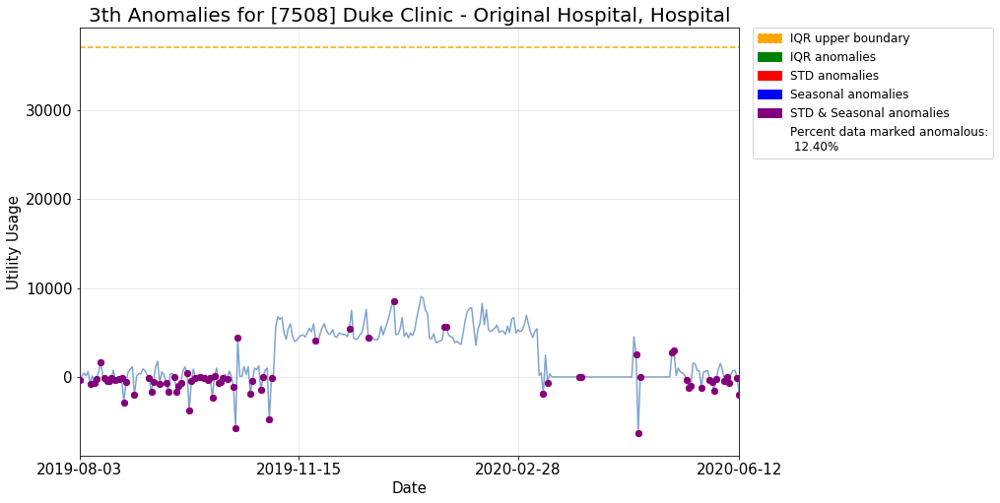

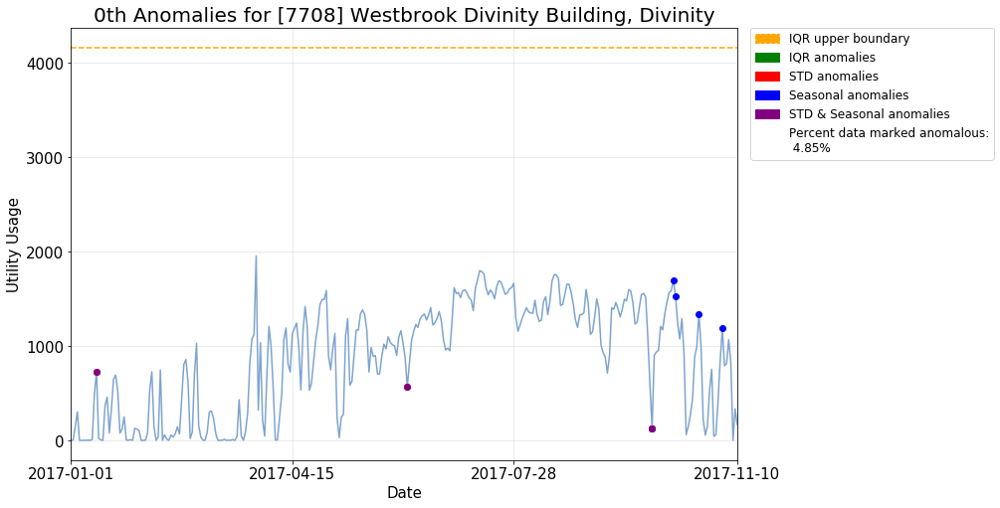

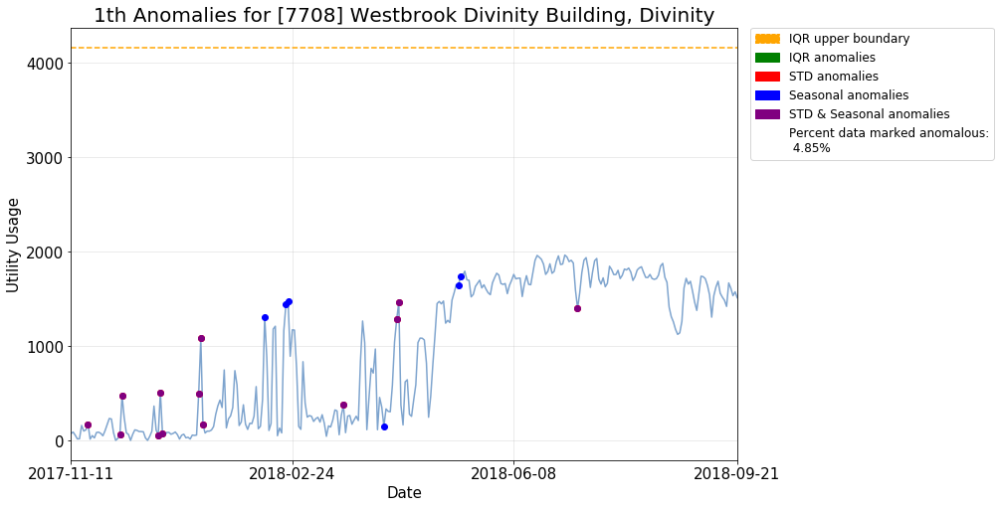

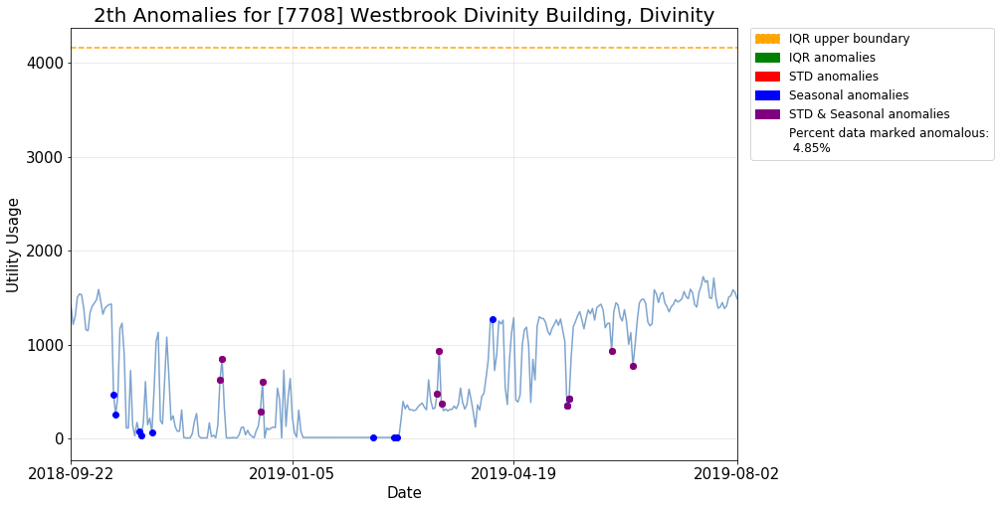

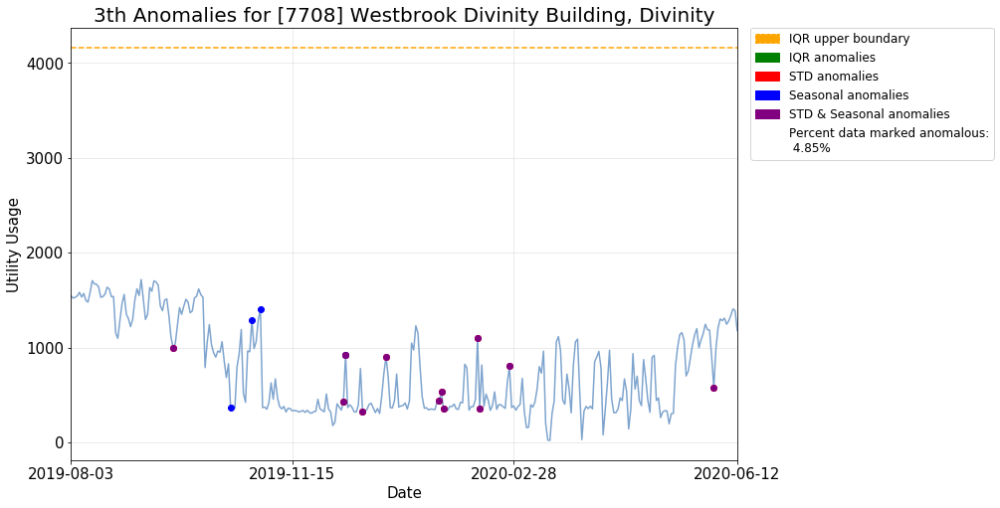

too little data
too little data


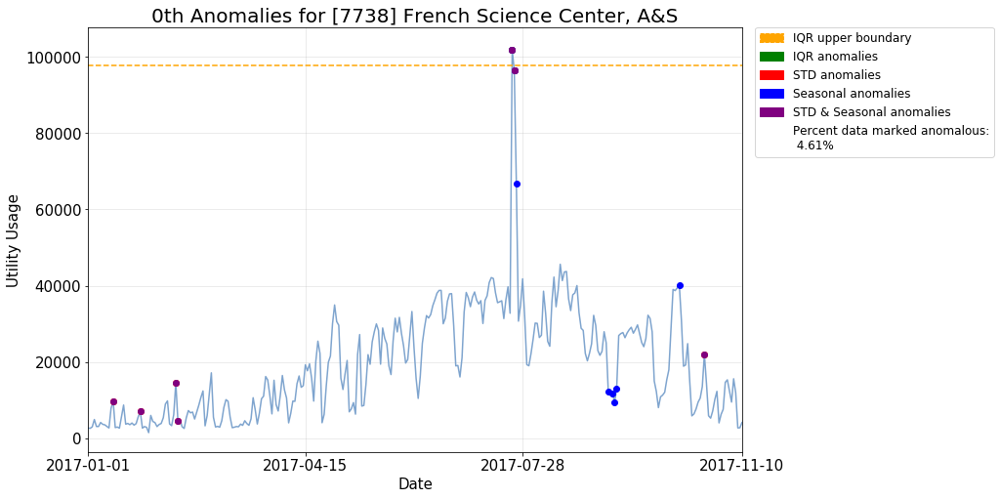

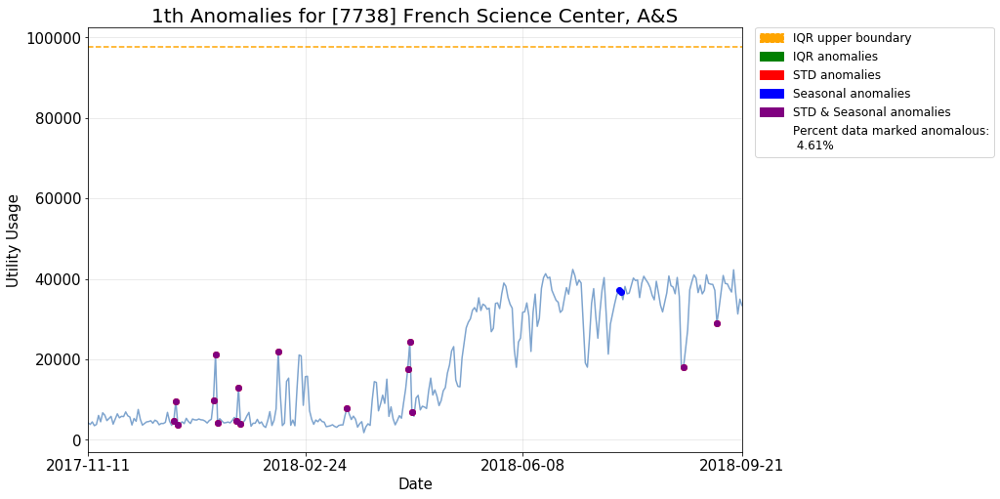

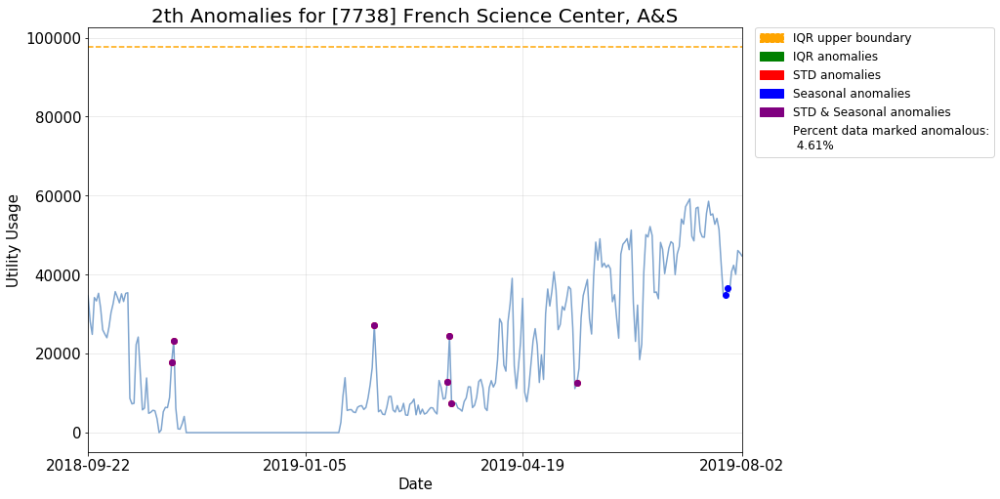

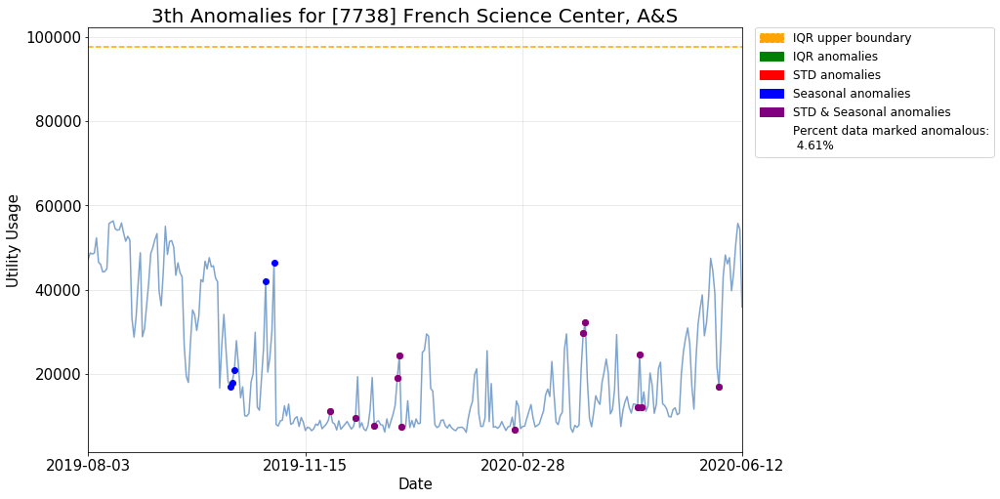

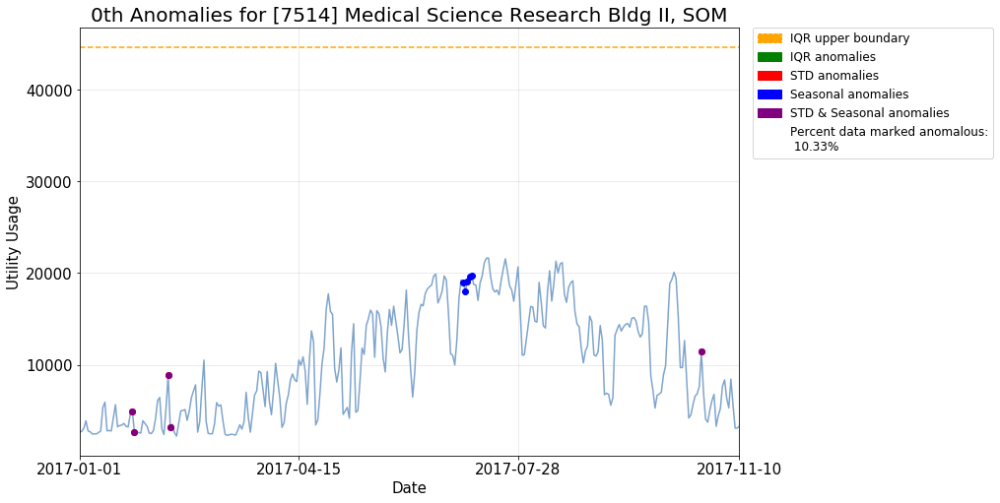

...

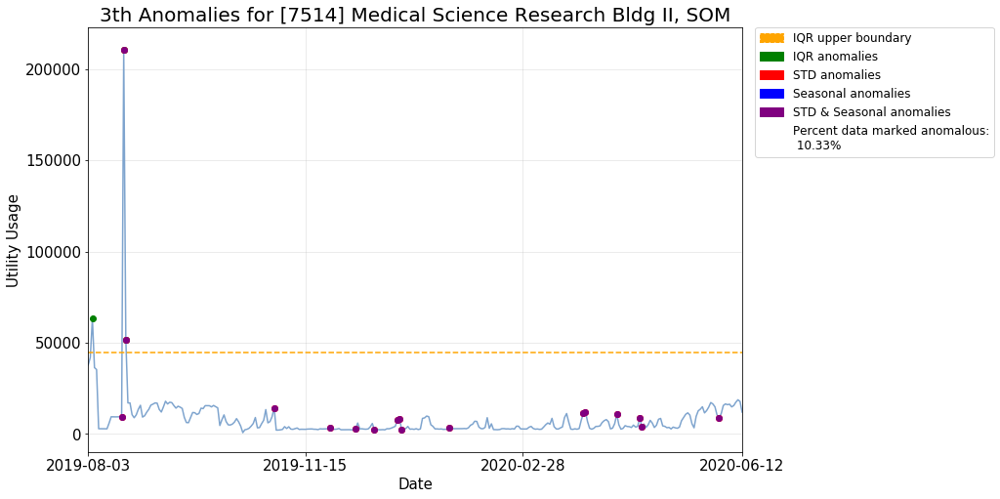

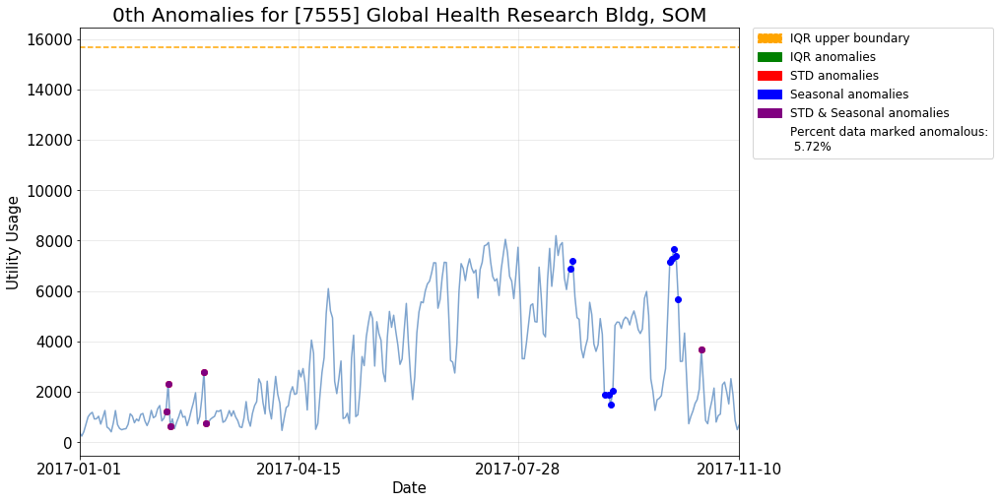

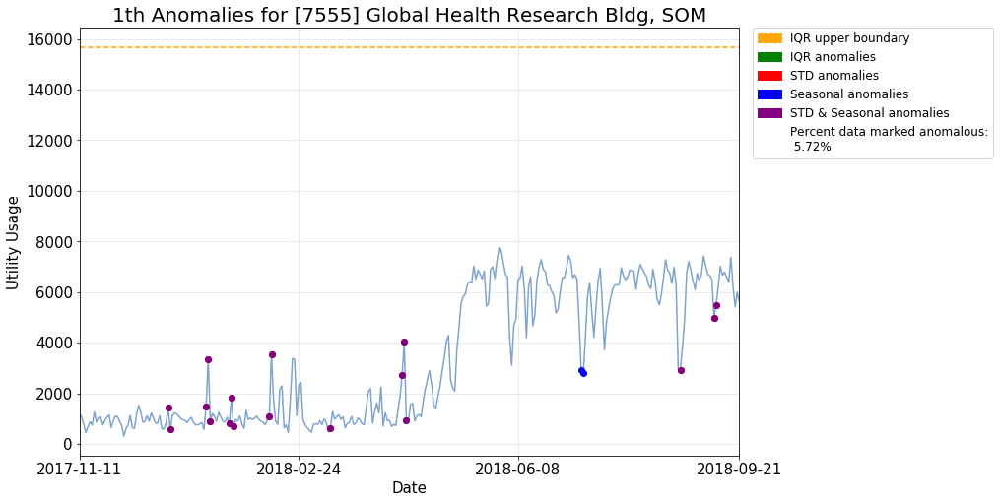

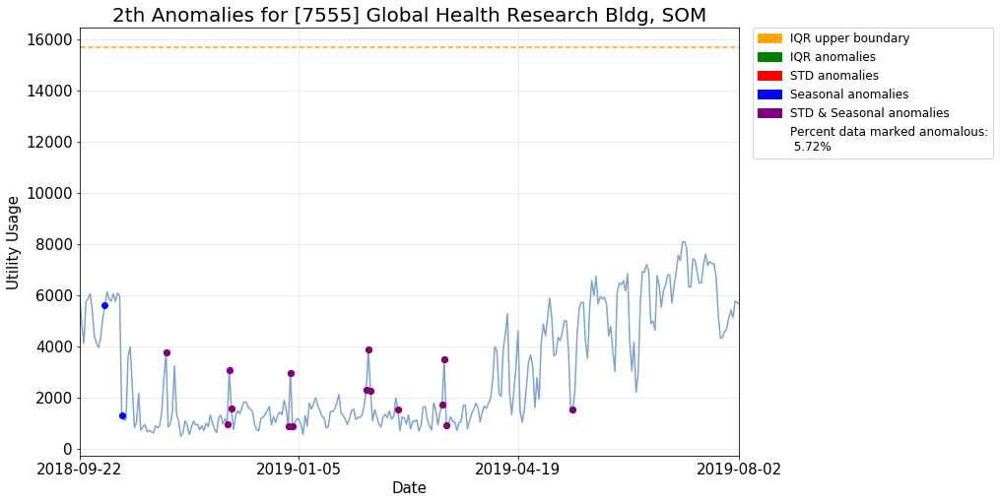

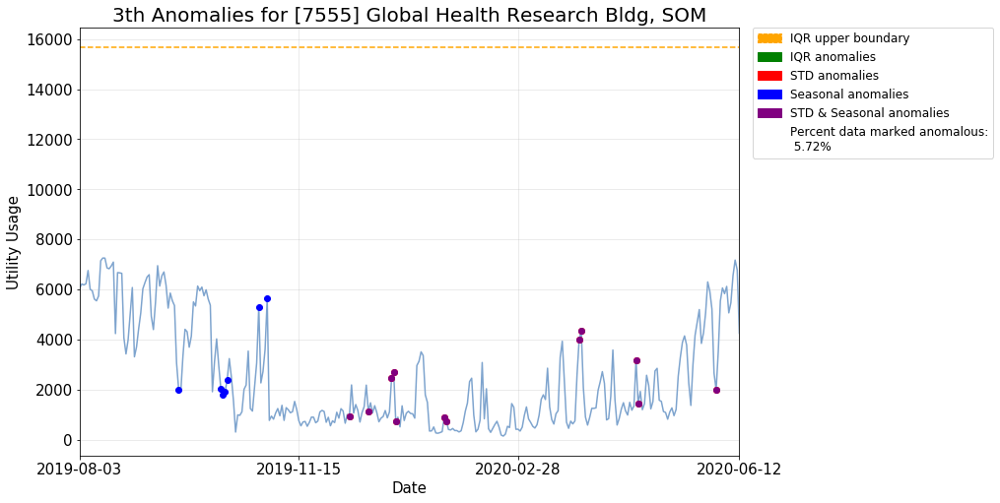

KeyboardInterrupt: 

In [6]:
plot_all_anomalies(chw_data_daily)

# Steam

In [ ]:
plot_all_anomalies(steam_data_daily)